In [4]:
from model_2 import *
from data_2 import *
import matplotlib.pyplot as plt
import numpy as np

In [5]:
train_ids = np.arange(8)
train_generator = DataGenerator(20, 'data/membrane/train/image', 'data/membrane/train/label', do_fft= False, batch_size=4)

Initialized with 500 total IDs


In [6]:
model = unet()
print(model.summary())

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 256, 256, 2)  0                                            
__________________________________________________________________________________________________
conv2d_12 (Conv2D)              (None, 256, 256, 128 2432        input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_13 (Conv2D)              (None, 256, 256, 128 147584      conv2d_12[0][0]                  
__________________________________________________________________________________________________
batch_normalization_6 (BatchNor (None, 256, 256, 128 512         conv2d_13[0][0]                  
____________________________________________________________________________________________

In [7]:
model.fit_generator(train_generator,epochs=16)

Epoch 1/16
125/125 [==============================] - 79s 636ms/step - loss: 0.1457 - mean_squared_error: 0.0867
Epoch 2/16
125/125 [==============================] - 73s 586ms/step - loss: 0.0593 - mean_squared_error: 0.0093
Epoch 3/16
125/125 [==============================] - 73s 588ms/step - loss: 0.0471 - mean_squared_error: 0.0060
Epoch 4/16
125/125 [==============================] - 74s 589ms/step - loss: 0.0394 - mean_squared_error: 0.0046
Epoch 5/16
125/125 [==============================] - 74s 589ms/step - loss: 0.0353 - mean_squared_error: 0.0038
Epoch 6/16
125/125 [==============================] - 74s 589ms/step - loss: 0.0332 - mean_squared_error: 0.0034
Epoch 7/16
125/125 [==============================] - 74s 590ms/step - loss: 0.0313 - mean_squared_error: 0.0031
Epoch 8/16
125/125 [==============================] - 74s 589ms/step - loss: 0.0294 - mean_squared_error: 0.0028
Epoch 9/16
125/125 [==============================] - 74s 590ms/step - loss: 0.0282 - mean_squar

In [31]:
# Make the data generator a python iterator
train_generator = DataGenerator(20, 'data/membrane/train/image', 'data/membrane/train/label', do_fft= False, batch_size=4)

ii_gen = iter(train_generator)

for i in range(2):
    X, y = next(ii_gen)

results = model.predict(X)
print(results.shape)

(4, 256, 256, 2)


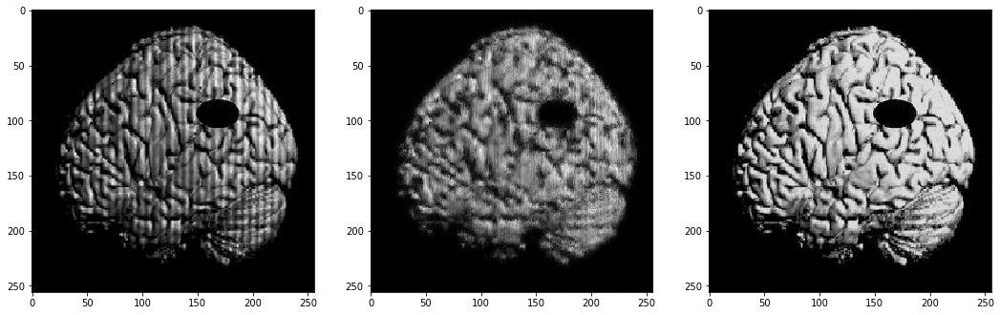

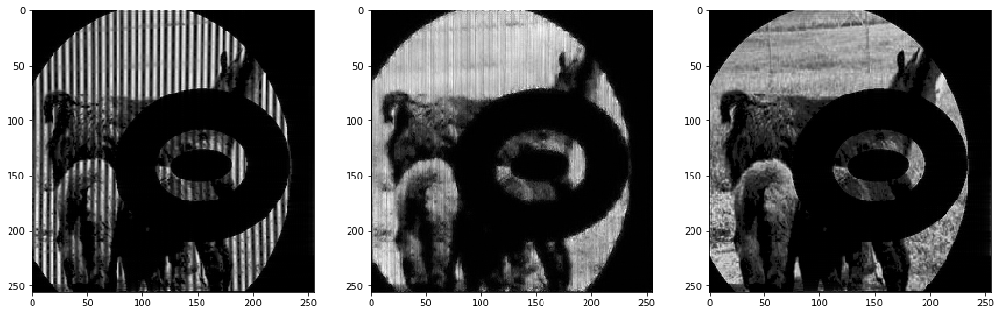

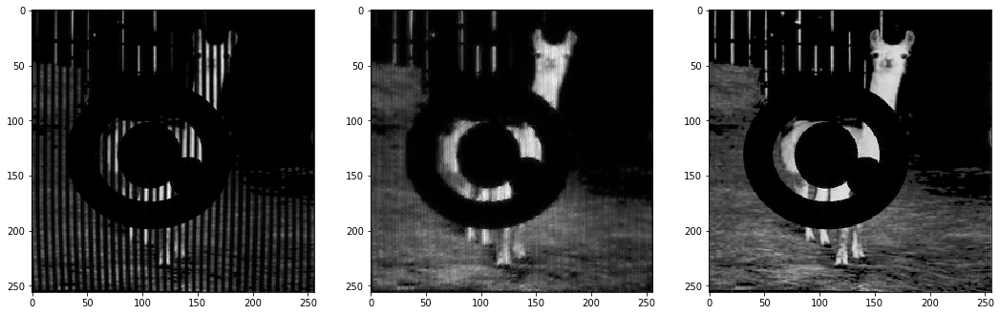

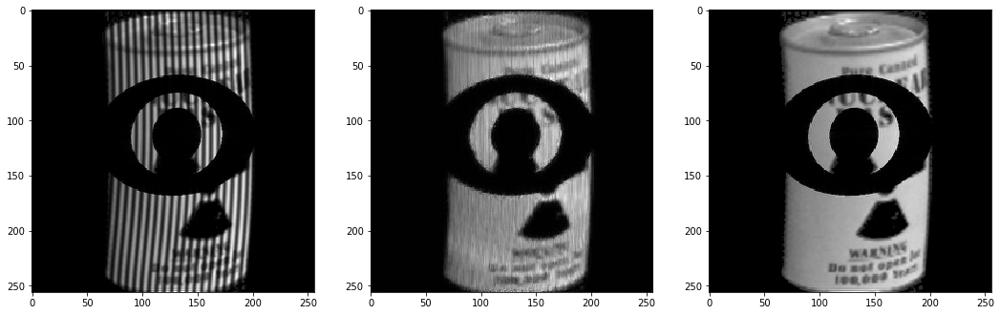

In [32]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.abs(im_X)), cmap='gray')
    
    axs[0,1].imshow((np.abs(im_res)), cmap='gray')
    
    axs[0,2].imshow((np.abs(im_y)), cmap='gray')

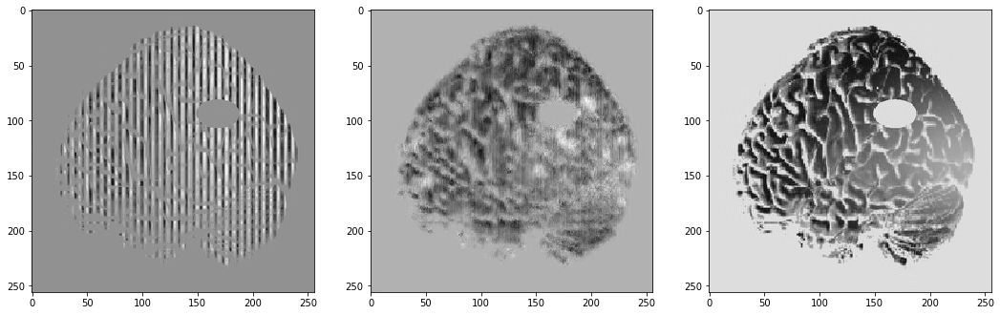

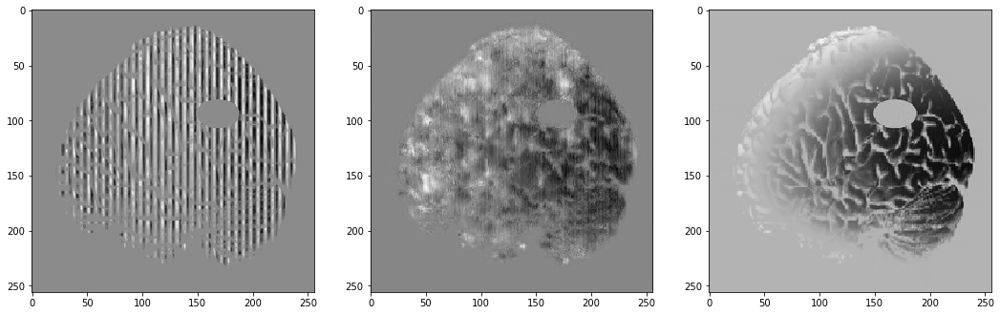

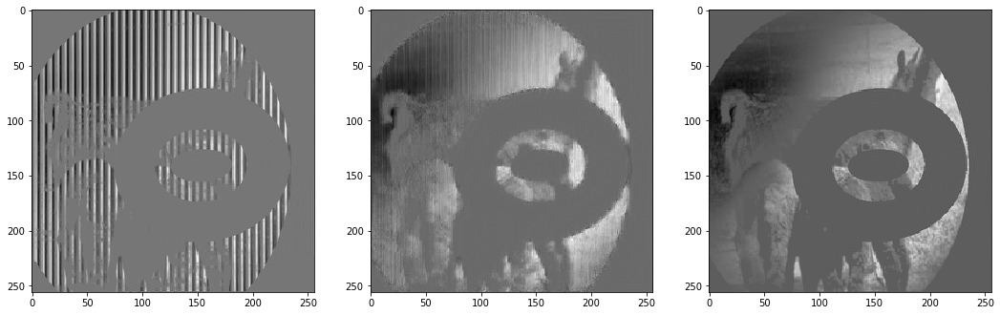

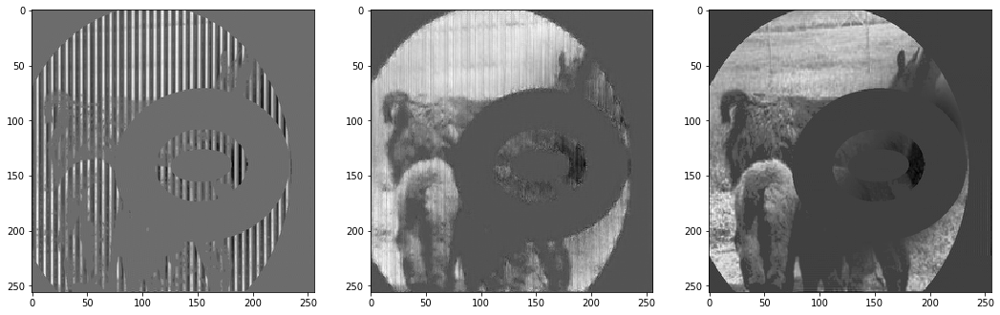

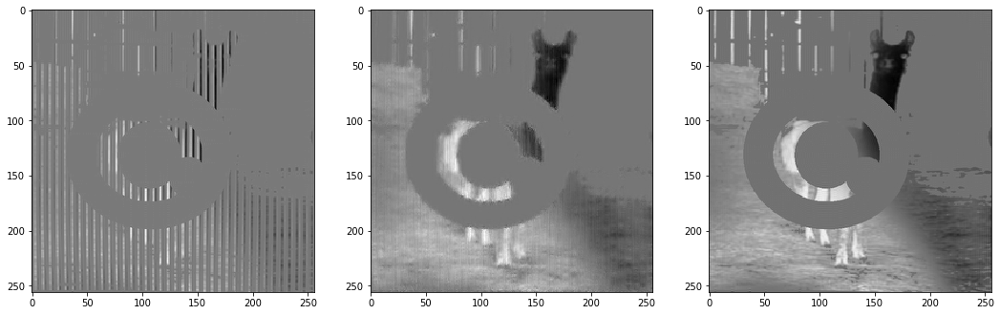

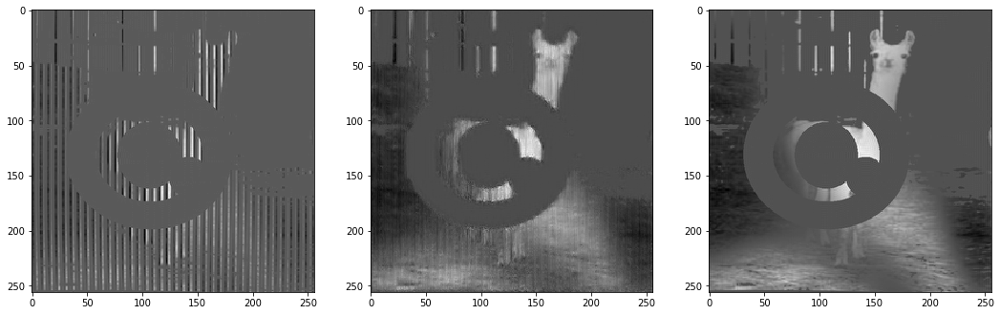

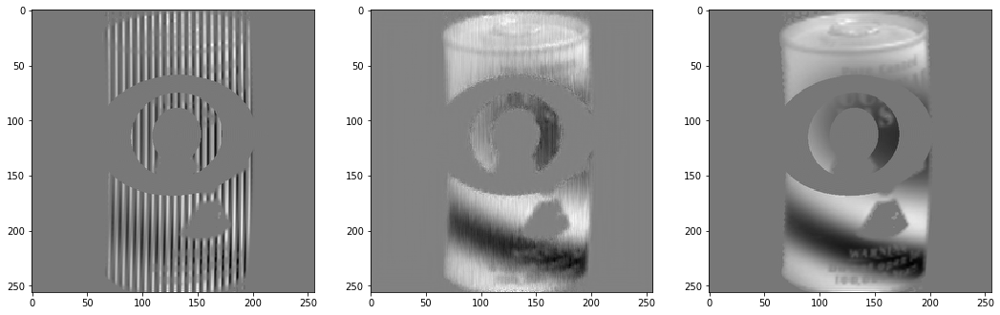

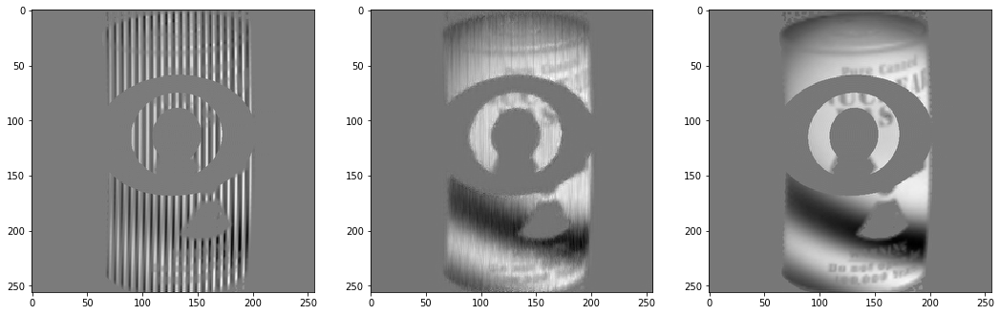

In [28]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.real(im_X)), cmap='gray')
    
    axs[0,1].imshow((np.real(im_res)), cmap='gray')
    
    axs[0,2].imshow((np.real(im_y)), cmap='gray')
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.imag(im_X)), cmap='gray')
    
    axs[0,1].imshow((np.imag(im_res)), cmap='gray')
    
    axs[0,2].imshow((np.imag(im_y)), cmap='gray')

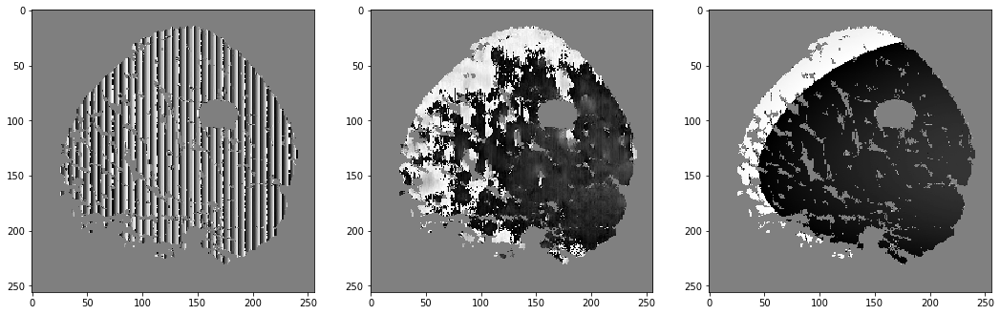

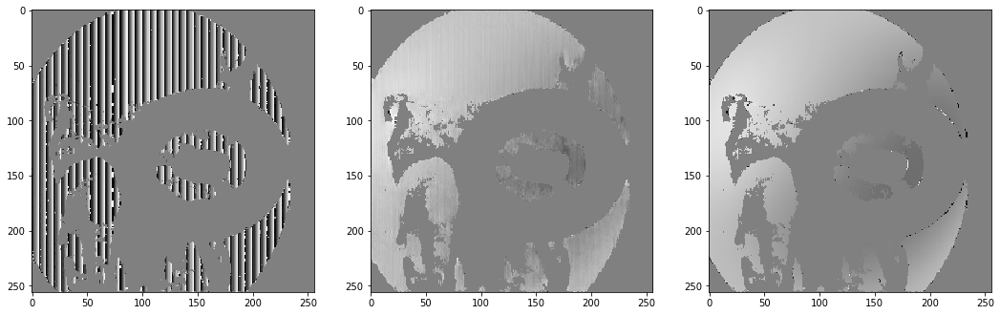

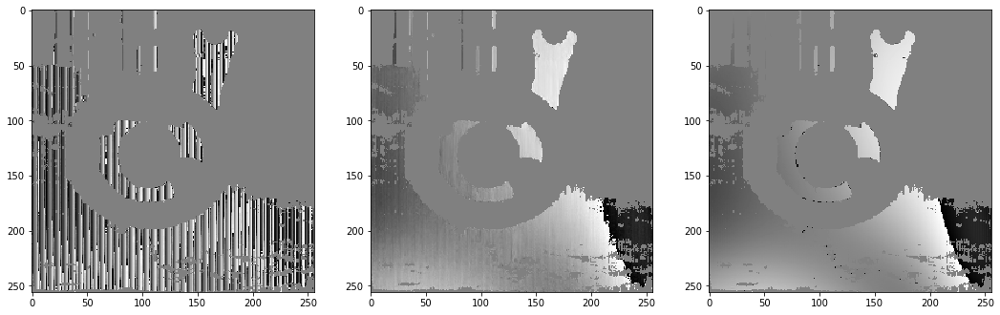

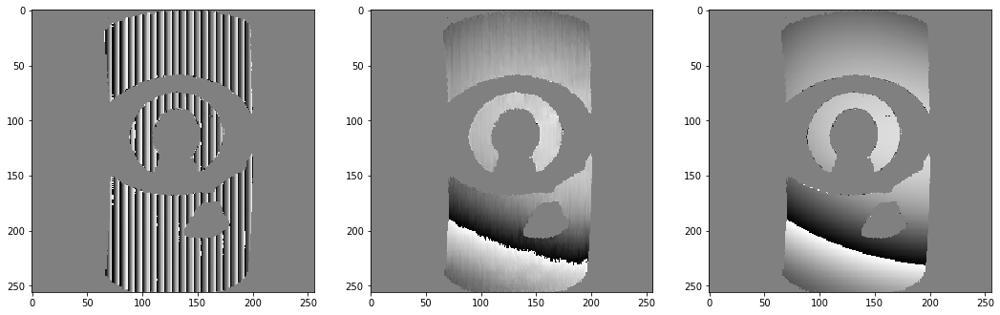

In [13]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    mask = np.abs(im_res) > 0.1
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((mask*np.angle(im_X)), cmap='gray')
    
    axs[0,1].imshow((mask*np.angle(im_res)), cmap='gray')
    
    axs[0,2].imshow((mask*np.angle(im_y)), cmap='gray')

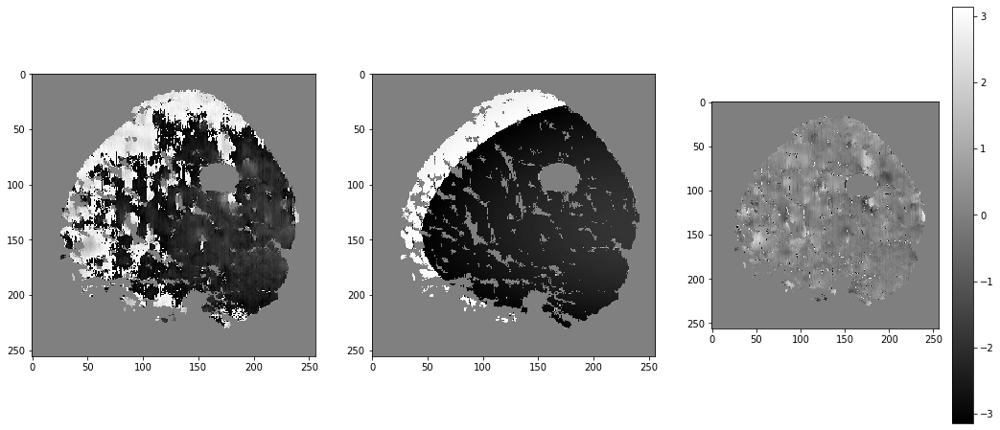

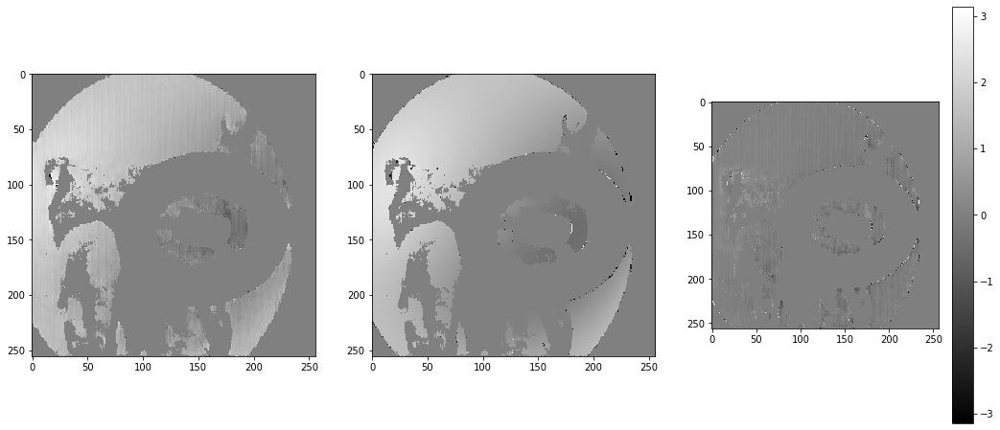

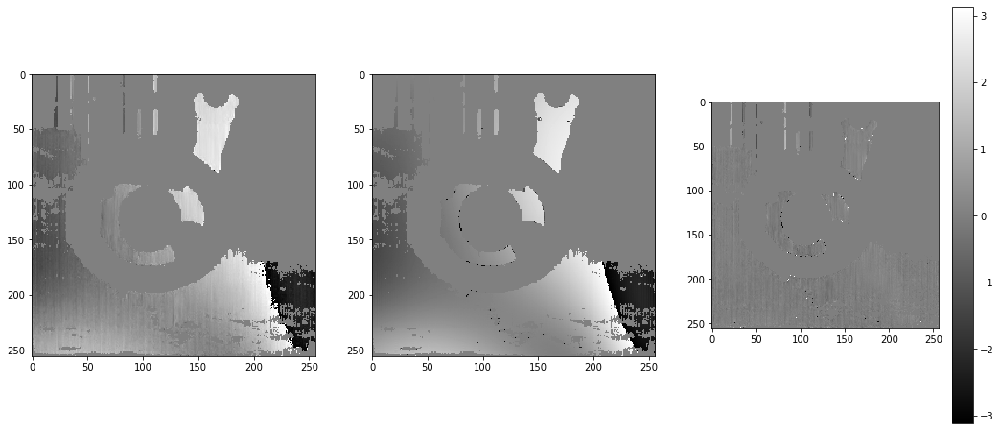

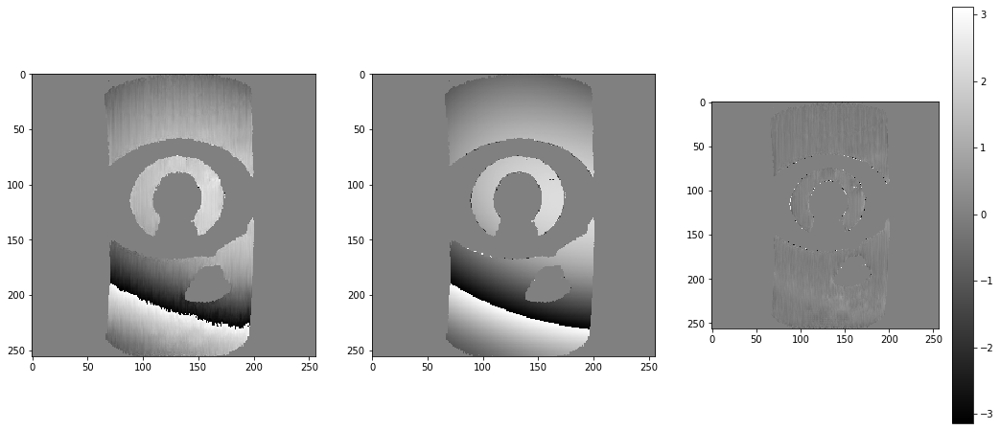

In [22]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    mask = np.abs(im_res) > 0.1
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    
    axs[0,0].imshow((mask*np.angle(im_res)), cmap='gray')
    
    axs[0,1].imshow((mask*np.angle(im_y)), cmap='gray')
    
    imsh = axs[0,2].imshow(mask*np.angle(im_y*np.exp(-1j*np.angle(im_res))), cmap='gray')
    fig.colorbar(imsh, ax=axs[0,2])

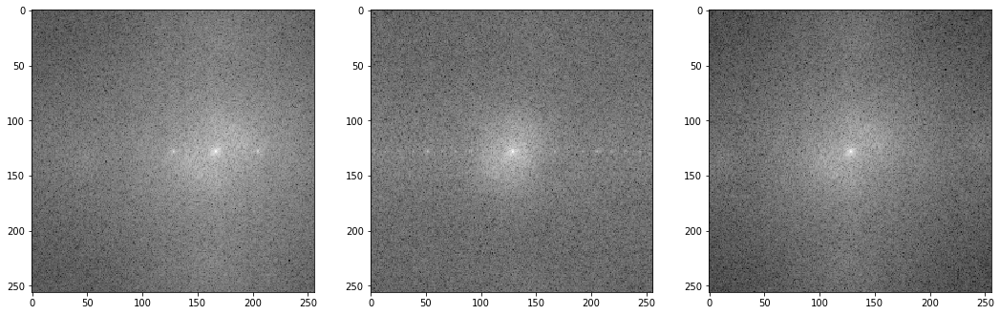

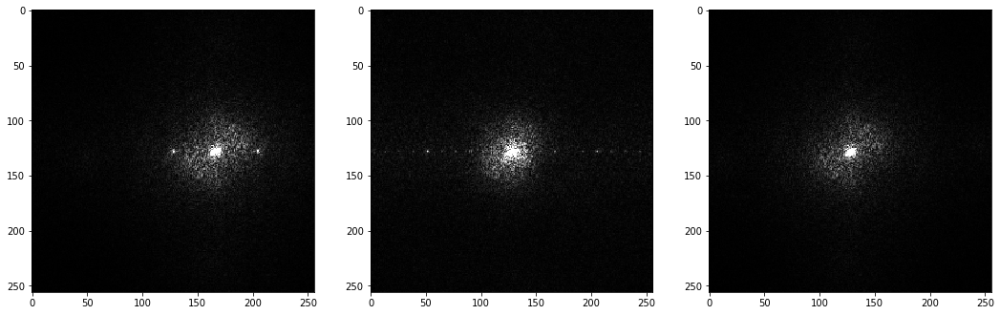

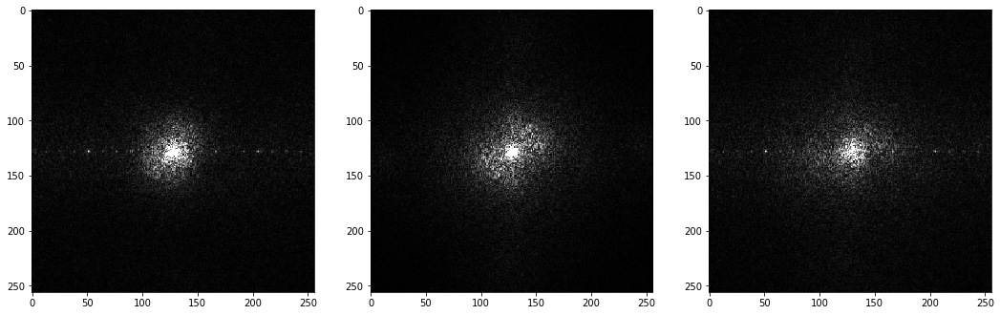

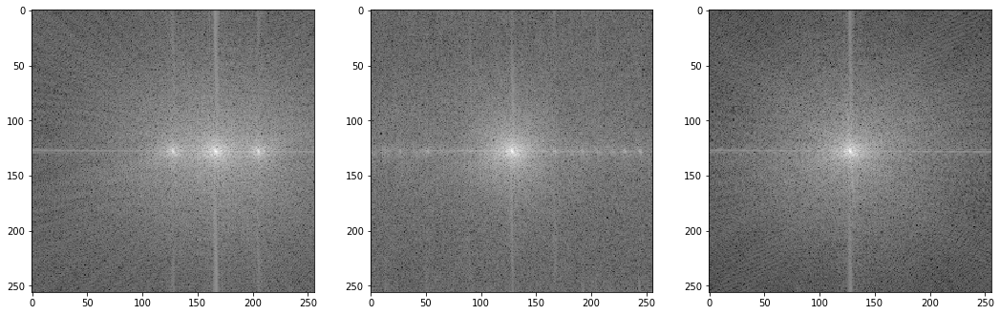

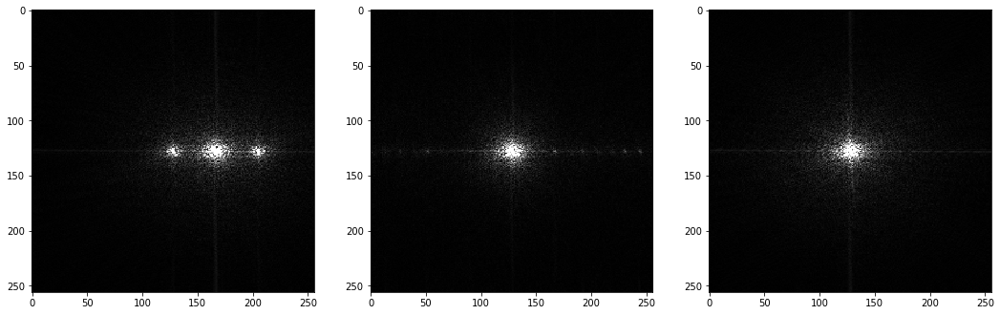

...

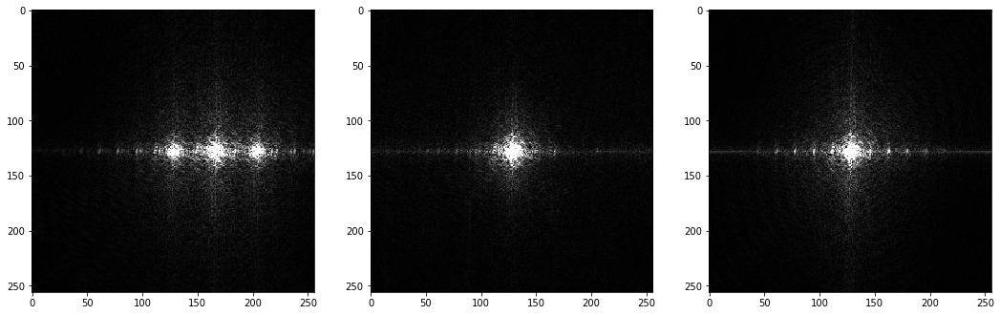

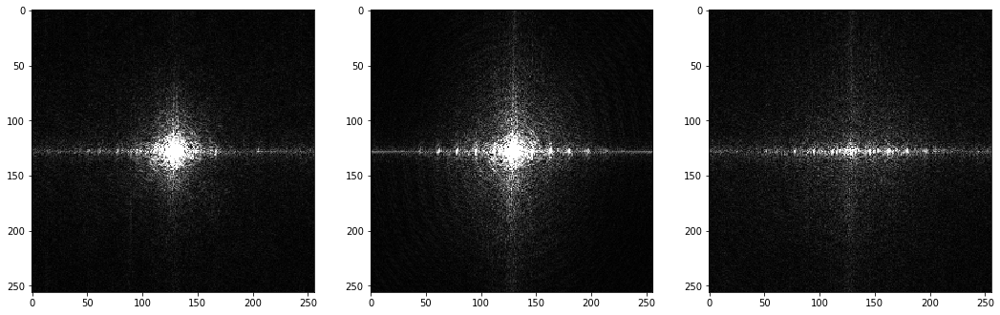

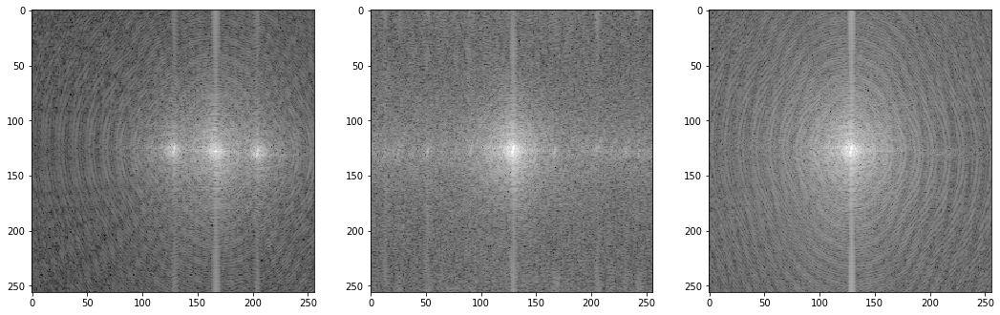

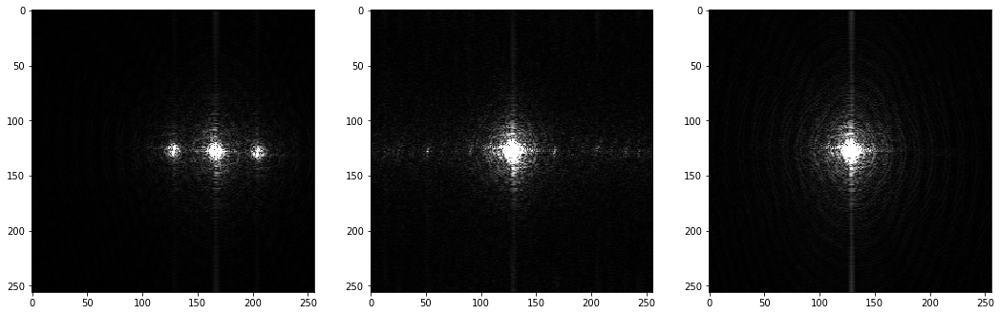

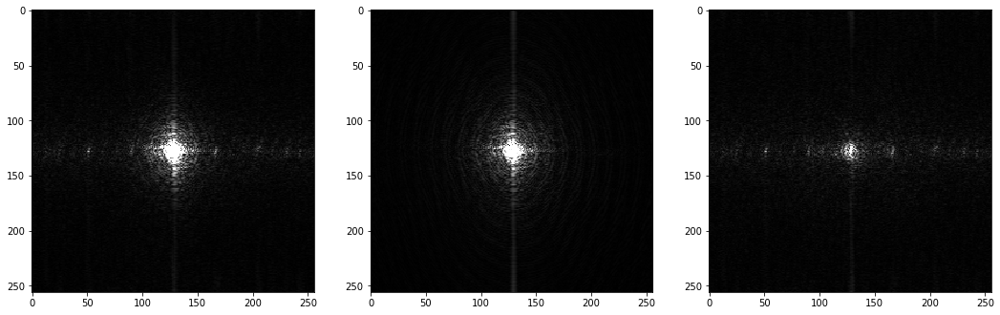

In [27]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    k_X = np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(im_X)))
    k_res = np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(im_res)))
    k_y = np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(im_y)))
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow(np.log(np.abs(k_X)), cmap='gray')
    
    axs[0,1].imshow(np.log(np.abs(k_res)), cmap='gray')
    
    axs[0,2].imshow(np.log(np.abs(k_y)), cmap='gray')
    
    
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.abs(k_X)), cmap='gray', clim = (0, 0.05*np.abs(k_X).max()))
    
    axs[0,1].imshow((np.abs(k_res)), cmap='gray', clim = (0, 0.05*np.abs(k_res).max()))
    
    axs[0,2].imshow((np.abs(k_y)), cmap='gray', clim = (0, 0.05*np.abs(k_y).max()))
    
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.abs(k_res)), cmap='gray', clim = (0, 0.05*np.abs(k_X).max()))
    
    axs[0,1].imshow((np.abs(k_y)), cmap='gray', clim = (0, 0.05*np.abs(k_X).max()))
    
    axs[0,2].imshow((np.abs(k_res-k_y)), cmap='gray', clim = (0, 0.05*np.abs(k_X).max()))

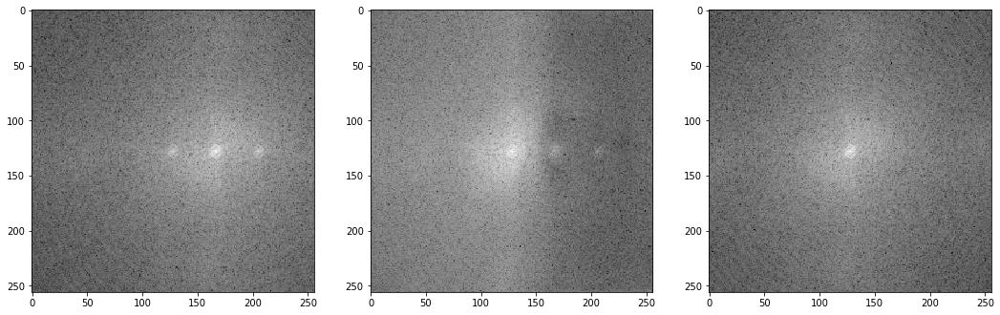

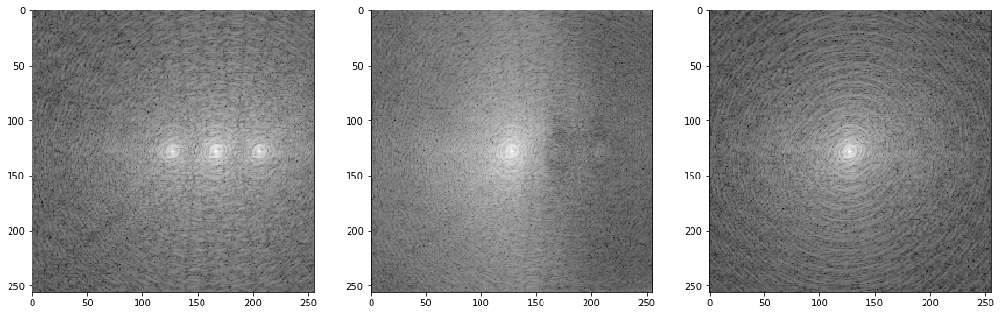

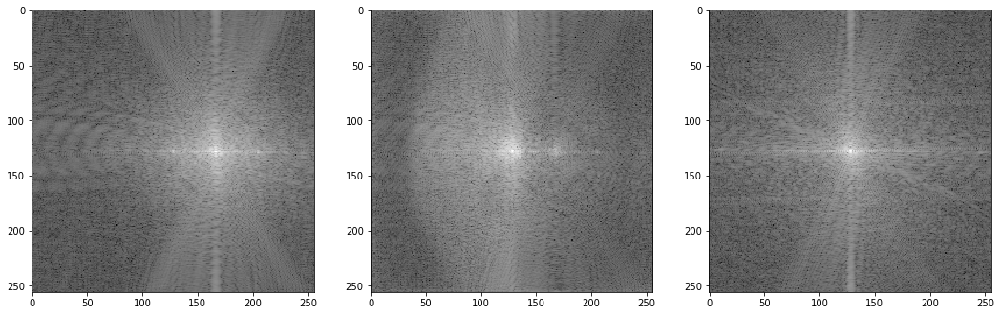

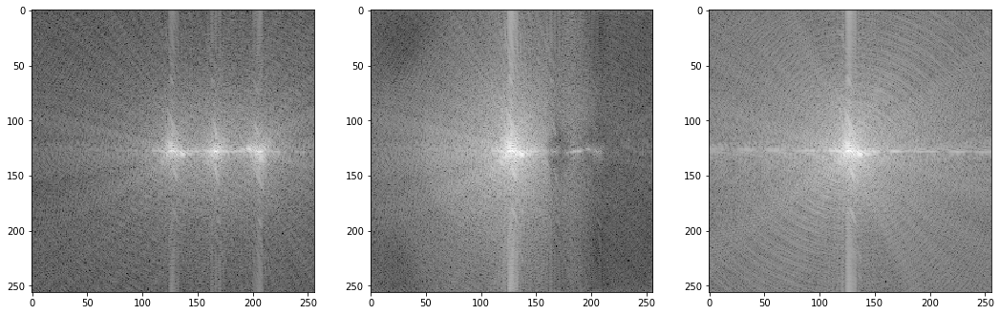

In [6]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow(np.log(np.abs(im_X)), cmap='gray')
    
    axs[0,1].imshow(np.log(np.abs(im_res)), cmap='gray')
    
    axs[0,2].imshow(np.log(np.abs(im_y)), cmap='gray')


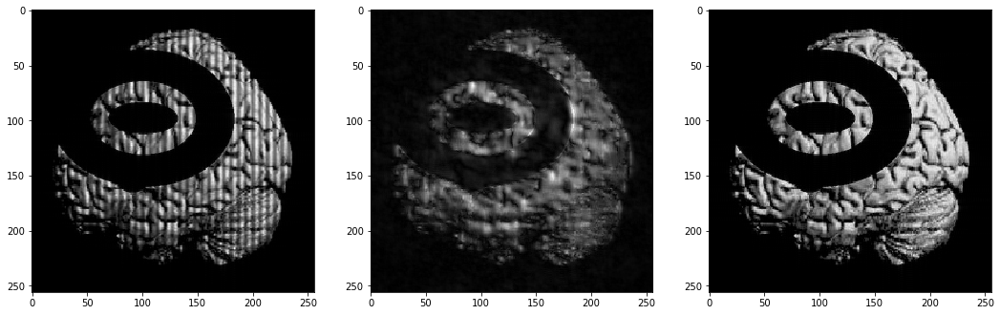

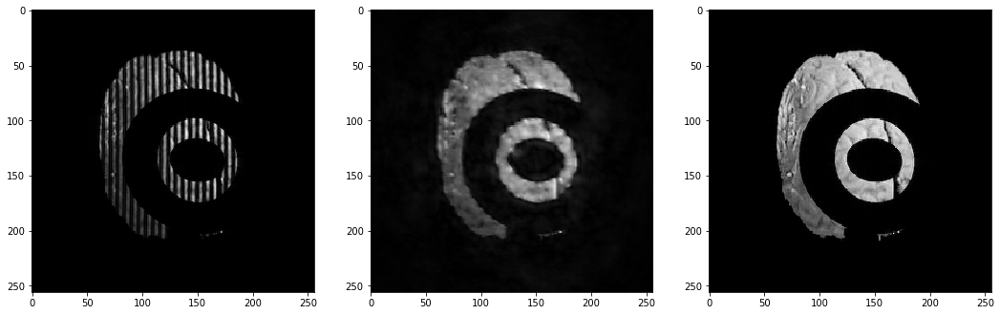

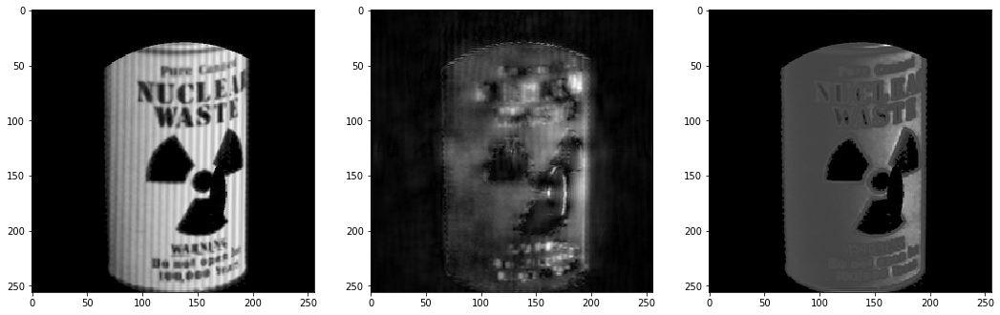

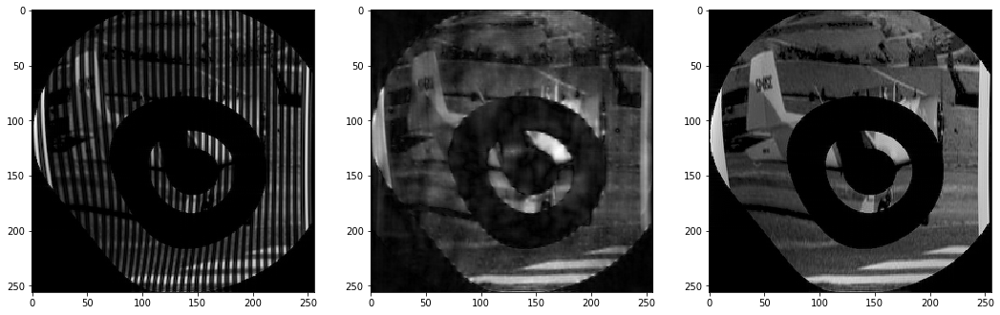

In [7]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    k_X = np.fft.ifftshift(np.fft.ifft2(np.fft.fftshift(im_X)))
    k_res = np.fft.ifftshift(np.fft.ifft2(np.fft.fftshift(im_res)))
    k_y = np.fft.ifftshift(np.fft.ifft2(np.fft.fftshift(im_y)))
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.abs(k_X)), cmap='gray')
    
    axs[0,1].imshow((np.abs(k_res)), cmap='gray')
    
    axs[0,2].imshow((np.abs(k_y)), cmap='gray')

## Tuning ideas
* Use all timeframes together
  * As channels (3D convolutions will be too expensive)
* Operate in k-space
* Which loss function is best
* Operate in image space, but loss function in k-space
* Play with activation functions, where to use batch normalization, learning rate adjustments, batch size
* Check initial image normalization (zero mean, stdev = 1)

## Implement validation, test data
* Validate on different simulations
* Test on the cardiac simulation
* Eventually we will test on our acquired DENSE data (I need to prep it)